In [1]:
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline


def plot_image(image):
    fix, ax = plt.subplots(figsize=(25, 25))
    ax.imshow(image)
    

In [2]:
damascus_prewar_raster = rasterio.open('../data/damascus_2011_08_22_zoom_19.tif')
damascus_prewar_array = damascus_prewar_raster.read(indexes=[1,2,3])
damascus_prewar_array = np.swapaxes(np.swapaxes(damascus_prewar_array, 1, 2), 0, 2)

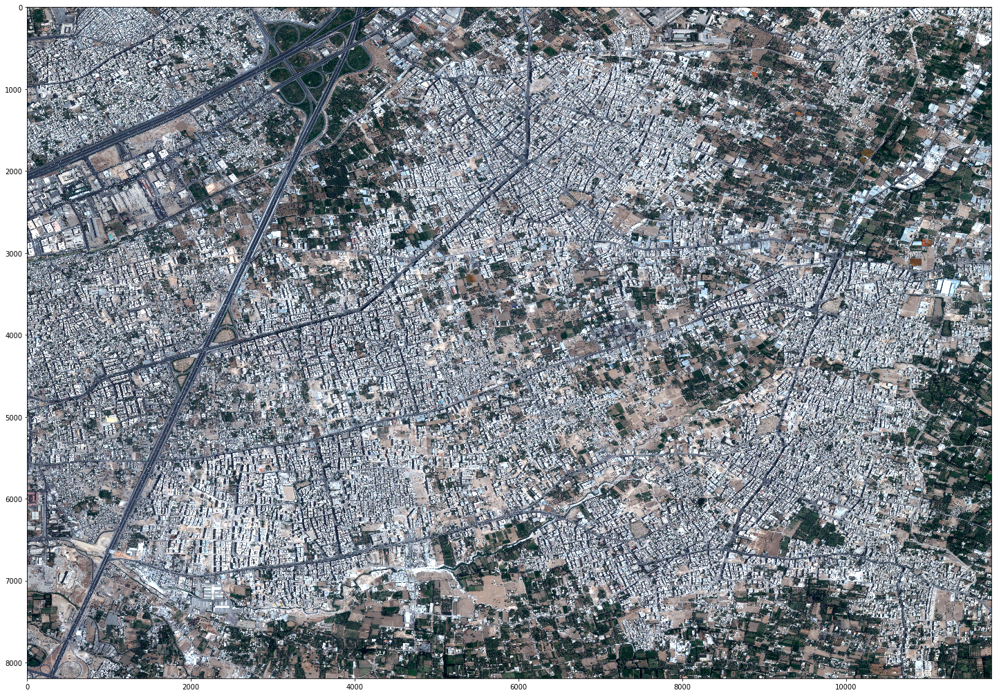

In [3]:
plot_image(damascus_prewar_array)

In [4]:
damascus_raster = rasterio.open('../data/damascus_2017_01_22_zoom_19.tif')
damascus_array = damascus_raster.read(indexes=[1,2,3])
damascus_array = np.swapaxes(np.swapaxes(damascus_array, 1, 2), 0, 2)

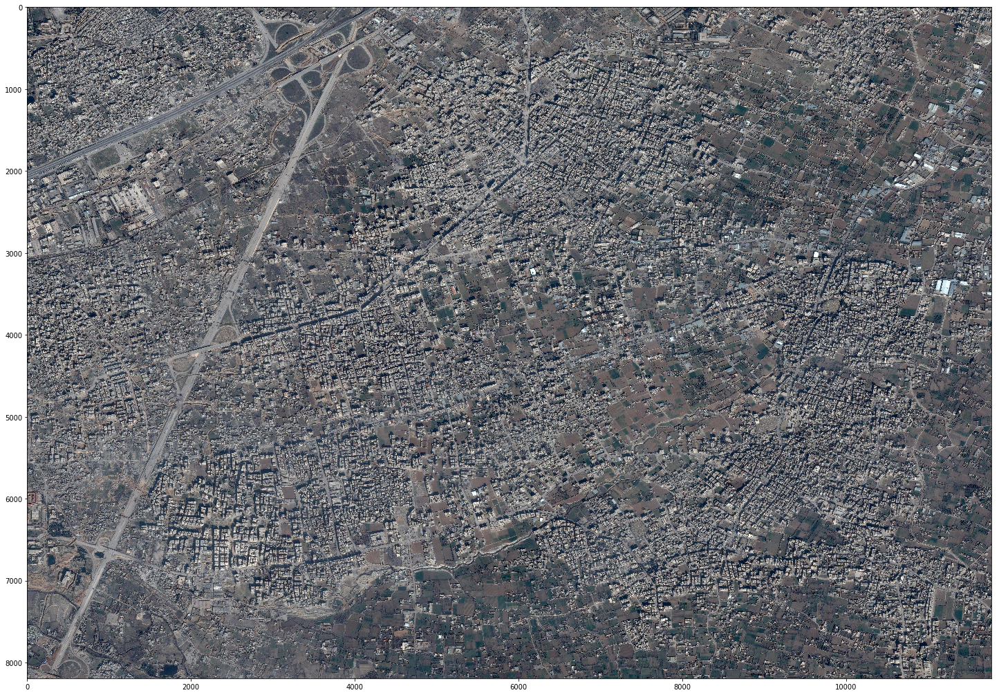

In [6]:
plot_image(damascus_array)
plt.savefig('../figures/damascus.pdf', dpi=300)

In [7]:
populated_areas = gpd.read_file('../data/populated_areas.shp')
populated_areas['name'] = populated_areas['NAME_EN'].str.lower()
print(populated_areas.shape)
populated_areas.head()

(5708, 24)


,NAME_EN,NAM_EN_REF,NAME_AR,NAM_AR_REF,PCODE,ADM3_EN,ADM3_AR,ADM3_PCODE,ADM2_EN,ADM2_AR,...,ADM0_EN,ADM0_AR,ADM0_PCODE,LATITUDE,LONGITUDE,ADM3_CAPIT,ADM1_CAPIT,UPDATE_DAT,geometry,name
0,Abu Kbee - East,Abu Kbee - East,Ø£Ø¨Ùˆ ÙƒØ¨ÙŠØ¹ Ø´Ø±Ù‚ÙŠ,Ø£Ø¨Ùˆ ÙƒØ¨ÙŠØ¹ Ø´Ø±Ù‚ÙŠ,C6723,Ar-Raqqa,Ù…Ø±ÙƒØ² Ø§Ù„Ø±Ù‚Ø©,None,Ar-Raqqa,Ù…Ø±ÙƒØ² Ø§Ù„Ø±Ù‚Ø©,...,Syrian Arab Republic,Ø§Ù„Ø¬Ù…Ù‡ÙˆØ±ÙŠØ© Ø§Ù„Ø¹Ø±Ø¨ÙŠØ© Ø§Ù„Ø³ÙˆØ±ÙŠØ©,SY,35.912789,38.909994,None,None,2016-09-05,"POLYGON ((38.91412141100005 35.91328160500007,...",abu kbee - east
1,Ajel,Ajel,Ø¹Ø§Ø¬Ù„,Ø¹Ø§Ø¬Ù„,C6753,Atareb,Ø£ØªØ§Ø±Ø¨,None,Jebel Saman,Ø¬Ø¨Ù„ Ø³Ù…Ø¹Ø§Ù†,...,Syrian Arab Republic,Ø§Ù„Ø¬Ù…Ù‡ÙˆØ±ÙŠØ© Ø§Ù„Ø¹Ø±Ø¨ÙŠØ© Ø§Ù„Ø³ÙˆØ±ÙŠØ©,SY,36.179877,36.953125,None,None,2016-09-05,"POLYGON ((36.95356450000003 36.18246830000004,...",ajel
2,Al Abdallah,Al Abdallah,Ø§Ù„Ø¹Ø¨Ø¯ Ø§Ù„Ù„Ù‡,Ø§Ù„Ø¹Ø¨Ø¯ Ø§Ù„Ù„Ù‡,C6733,Karama,Ø§Ù„ÙƒØ±Ø§Ù…Ø©,None,Ar-Raqqa,Ù…Ø±ÙƒØ² Ø§Ù„Ø±Ù‚Ø©,...,Syrian Arab Republic,Ø§Ù„Ø¬Ù…Ù‡ÙˆØ±ÙŠØ© Ø§Ù„Ø¹Ø±Ø¨ÙŠØ© Ø§Ù„Ø³ÙˆØ±ÙŠØ©,SY,35.982939,39.097932,None,None,2016-09-05,"POLYGON ((39.09338407500007 35.97671661600003,...",al abdallah
3,Al Barouda,Al Barouda,Ø§Ù„Ø¨Ø§Ø±ÙˆØ¯Ø©,Ø§Ù„Ø¨Ø§Ø±ÙˆØ¯Ø©,C6720,Mansura,Ø§Ù„Ù…Ù†ØµÙˆØ±Ø©,None,Ath-Thawrah,Ø§Ù„Ø«ÙˆØ±Ø©,...,Syrian Arab Republic,Ø§Ù„Ø¬Ù…Ù‡ÙˆØ±ÙŠØ© Ø§Ù„Ø¹Ø±Ø¨ÙŠØ© Ø§Ù„Ø³ÙˆØ±ÙŠØ©,SY,35.896964,38.802059,None,None,2016-09-05,"POLYGON ((38.79519559900007 35.89591762800006,...",al barouda
4,Al Basna,Al Basna,Ø§Ù„Ø¨ØµÙ†Ø©,Ø§Ù„Ø¨ØµÙ†Ø©,C6744,Shadadah,Ø´Ø¯Ø§Ø¯Ø©,None,Al-Hasakeh,Ù…Ø±ÙƒØ² Ø§Ù„Ø­Ø³ÙƒØ©,...,Syrian Arab Republic,Ø§Ù„Ø¬Ù…Ù‡ÙˆØ±ÙŠØ© Ø§Ù„Ø¹Ø±Ø¨ÙŠØ© Ø§Ù„Ø³ÙˆØ±ÙŠØ©,SY,36.082234,40.702094,None,None,2016-09-05,"POLYGON ((40.69825104600005 36.08139507400006,...",al basna


In [8]:
mp = MultiPolygon(populated_areas.loc[populated_areas['name'] == 'damascus', 'geometry'].tolist())

In [9]:
def _lats_longs_to_rows_cols(lats_longs, dataset):
    # geotiff images cover the same bounding box and have the same
    # dimensions, so anyone can be used
    # TODO check it, that the result is the same if we change the dataset
    rows_cols = []
    for ll in lats_longs:
        lat, long = ll[0], ll[1]
        r, c = dataset.index(long, lat)
        rows_cols.append((r, c))

    rows_cols = np.array(rows_cols)
    return rows_cols

dataset = damascus_raster
polysPx = []
for polygon in mp.geoms:
    lat_long = np.array([(long_lat[1], long_lat[0]) for long_lat in polygon.exterior.coords])
    rows_cols = _lats_longs_to_rows_cols(lat_long, dataset)
    rows = rows_cols[:,0]
    cols = rows_cols[:,1]
    # PopulatedPoly (and no analysis polygon also) from Damage
    # can have vertices with negative coordinates in pixels so we need to
    # bound the polygon in pixels to be inside the image
    rows = np.minimum(np.maximum(rows,0), dataset.height-1)            
    cols = np.minimum(np.maximum(cols,0), dataset.width-1)
    cols_rows = np.vstack([cols,rows]).T # swaps columns 
    poly = Polygon(cols_rows)
    if poly.area>0:
        polysPx.append(poly)
        # this is to avoid potential problems later when we check
        # if a pixel is within a polygon or not

multipolygon = MultiPolygon(polysPx)

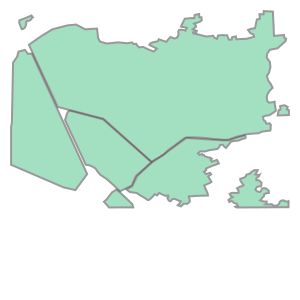

In [10]:
multipolygon

In [23]:
damage_data_damascus = gpd.read_file('../data/Damage_Sites_Damascus_2017_Ex_Update.shp')
#damage_data_damascus['DmgCls'] = damage_data_damascus['DmgCls'].replace({None: 'No Visible damage'})
damage_data_damascus['geometry_tuple'] = damage_data_damascus['geometry'].apply(lambda point: (point.x, point.y))
damage_data_damascus['latitude'] = damage_data_damascus['geometry'].apply(lambda point: point.y)
damage_data_damascus['longitude'] = damage_data_damascus['geometry'].apply(lambda point: point.x)
print(damage_data_damascus.shape)
damage_data_damascus.head()

(12601, 20)


,SiteID,SensDate,SensorID,ConfID,DmgCls,SensDate_2,SensorID_2,ConfID_2,DmgCls_2,DmgSts_2,GrDaCl,FieldVl,Notes,Settl_Name,Neigh,EventCode,geometry,geometry_tuple,latitude,longitude
0,Building (General / Default),2016-04-02,Worldview-2,Very High,Destroyed,2017-12-03,WorldView-3,Very High,Destroyed,No change,Damaged Buildings,Not yet field validated,None,Damascus,Unknown,CE20130604SYR,POINT (36.33532038400006 33.53922281800004),"(36.335320384000056, 33.53922281800004)",33.539223,36.335320
1,Building (General / Default),2016-04-02,Worldview-2,Very High,Severe Damage,2017-12-03,WorldView-3,Very High,Destroyed,Increase - damage,Damaged Buildings,Not yet field validated,None,Damascus,Unknown,CE20130604SYR,POINT (36.33341618400004 33.53820987600005),"(36.33341618400004, 33.53820987600005)",33.538210,36.333416
2,Building (General / Default),2016-04-02,Worldview-2,Medium,Moderate Damage,2017-12-03,WorldView-3,Medium,Destroyed,Increase - damage,Damaged Buildings,Not yet field validated,None,Damascus,Unknown,CE20130604SYR,POINT (36.33395225400005 33.53850257700003),"(36.33395225400005, 33.53850257700003)",33.538503,36.333952
3,Building (General / Default),2016-04-02,Worldview-2,Medium,Moderate Damage,2017-12-03,WorldView-3,Medium,Destroyed,Increase - damage,Damaged Buildings,Not yet field validated,None,Damascus,Unknown,CE20130604SYR,POINT (36.33391607800007 33.53840391300002),"(36.33391607800007, 33.538403913000025)",33.538404,36.333916
4,Building (General / Default),2016-04-02,Worldview-2,Medium,Moderate Damage,2017-12-03,WorldView-3,Medium,Destroyed,Increase - damage,Damaged Buildings,Not yet field validated,None,Damascus,Unknown,CE20130604SYR,POINT (36.33349182600006 33.53833484900008),"(36.333491826000056, 33.53833484900008)",33.538335,36.333492


In [25]:
damage_data_damascus['DmgCls'].value_counts()

Severe Damage      5096
Moderate Damage    3648
Destroyed          3040
Name: DmgCls, dtype: int64

In [27]:
damage_data_damascus['DmgCls'].isnull().sum()

817

In [17]:
damage_data_damascus['DmgCls_2'].value_counts()

Severe Damage        5141
Destroyed            3853
Moderate Damage      3547
No Visible Damage      60
Name: DmgCls_2, dtype: int64

In [28]:
damage_data_damascus['DmgCls_2'].isnull().sum()

0

In [21]:
damage_data_damascus['DmgSts_2'].value_counts()

No change            10777
Increase - damage      947
New - damage           817
Decrease - damage       60
Name: DmgSts_2, dtype: int64

In [31]:
def _add_rows_cols_to_dataframe(raster_annotation, raster_city):
    '''
    Transforms an array of (latitude, longitude) to pixel coordinates (row, col)
    according to some rasterio dataset, which has the method to do it.
    =====
    Outputs:
    * rows_cols (np.array, int): array in pixels
    '''  
    indices = raster_annotation.apply(lambda x: pd.Series({key: i for key, i in zip(['row', 'col'], dataset.index(x['longitude'], x['latitude']))}), axis=1)
    print('{} total damage points'.format(len(indices)))    
    raster_annotation = pd.merge(raster_annotation, indices, right_index=True, left_index=True)
    mask = (raster_annotation['row'] < raster_city.height)\
        & (raster_annotation['row'] >= 0)\
        & (raster_annotation['col'] < raster_city.width)\
        & (raster_annotation['col'] >= 0)
    print('{} valid (=inside image) damage points'.format(np.sum(mask)))
    return raster_annotation.loc[mask]

In [32]:
damage_damascus = _add_rows_cols_to_dataframe(damage_data_damascus, damascus_raster)

12601 total damage points
12601 valid (=inside image) damage points


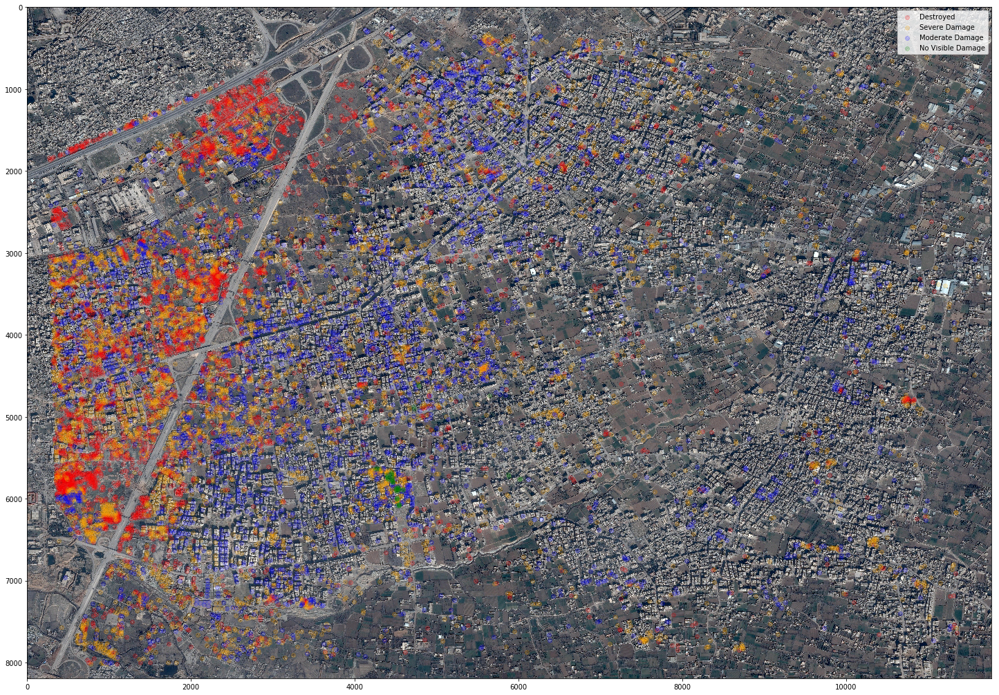

In [33]:
fig, ax = plt.subplots(figsize=(25, 25))
ax.imshow(damascus_array)
damages = {
    'Destroyed': 'red', 
    'Severe Damage': 'orange', 
    'Moderate Damage': 'blue',
    'No Visible Damage': 'green'
}
for damage, color in damages.items():
    ax.scatter(damage_damascus.loc[damage_damascus['DmgCls_2'] == damage, 'col'], damage_damascus.loc[damage_damascus['DmgCls_2'] == damage, 'row'],
               alpha=0.2, label=damage, color=color)
    
plt.legend()
plt.savefig('../figures/damascus_destroyed.pdf')